In [ ]:
import os
import zipfile
import pandas as pd
import numpy as np
import tensorflow as tf
import cv2
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, Dropout, concatenate, Conv2DTranspose
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.losses import binary_crossentropy
from sklearn.model_selection import train_test_split

# Mount Google Drive
from google.colab import drive
drive.mount('/content/drive')




Mounted at /content/drive


In [ ]:
# Define paths
data_dir = "/content/drive/My Drive/MedIA"
train_zip_path = os.path.join(data_dir, "training_set.zip")
test_zip_path = os.path.join(data_dir, "test_set.zip")
train_csv_path = os.path.join(data_dir, "training_set_pixel_size_and_HC.csv")
test_csv_path = os.path.join(data_dir, "test_set_pixel_size.csv")


In [ ]:
# Unzip training and test sets
with zipfile.ZipFile(train_zip_path, 'r') as zip_ref:
    zip_ref.extractall(data_dir)

with zipfile.ZipFile(test_zip_path, 'r') as zip_ref:
    zip_ref.extractall(data_dir)



In [ ]:
# Load CSV files
train_df = pd.read_csv(train_csv_path)
test_df = pd.read_csv(test_csv_path)

In [ ]:
# Create DataFrame for image and annotation filenames
training_set_dir = os.path.join(data_dir, "training_set")
training_set_files = os.listdir(training_set_dir)
image_filenames = [filename for filename in training_set_files if not filename.endswith('_Annotation.png')]
annotation_filenames = [filename for filename in training_set_files if filename.endswith('_Annotation.png')]
df = pd.DataFrame({'image_filename': image_filenames, 'annotation_filename': annotation_filenames})

# Display the DataFrame
print(df)

    image_filename     annotation_filename
0       164_HC.png   164_HC_Annotation.png
1       165_HC.png   165_HC_Annotation.png
2       166_HC.png   166_HC_Annotation.png
3       167_HC.png   167_HC_Annotation.png
4       168_HC.png   168_HC_Annotation.png
..             ...                     ...
994     160_HC.png   160_HC_Annotation.png
995     161_HC.png   161_HC_Annotation.png
996     162_HC.png   162_HC_Annotation.png
997     163_HC.png   163_HC_Annotation.png
998    164_2HC.png  164_2HC_Annotation.png

[999 rows x 2 columns]


In [ ]:
# Define data loading functions
def load_data(file_paths, target_size=(256, 256)):
    data = []
    for file_path in file_paths:
        img = tf.keras.preprocessing.image.load_img(file_path, color_mode='grayscale', target_size=target_size)
        img_array = tf.keras.preprocessing.image.img_to_array(img) / 255.0
        data.append(img_array)
    return np.array(data)




In [ ]:
# Load test images
test_image_paths = [os.path.join(data_dir, "test_set", filename) for filename in test_df['filename']]
test_images = load_data(test_image_paths)

# Load annotations for test set
annotations_directory = os.path.join(data_dir, "training_set")  # Adjust the directory according to your dataset structure
annotation_extension = "_Annotation.png"  # Adjust the extension according to your annotation file format

# Load annotations for each test image
test_annotations = []
for filename in test_df['filename']:
    annotation_filename = filename.replace(".png", annotation_extension)
    annotation_path = os.path.join(annotations_directory, annotation_filename)
    annotation_image = cv2.imread(annotation_path, cv2.IMREAD_GRAYSCALE)
    test_annotations.append(annotation_image)

In [ ]:
# Load training images
train_image_paths = [os.path.join(data_dir, "training_set", filename) for filename in df['image_filename']]
train_images = load_data(train_image_paths)

# Load training masks
train_mask_paths = [os.path.join(data_dir, "training_set", filename) for filename in df['annotation_filename']]
train_masks = load_data(train_mask_paths)

# Split training data into training and validation sets
train_images, val_images, train_masks, val_masks = train_test_split(train_images, train_masks, test_size=0.2, random_state=42)


In [ ]:
# Define U-Net model
def unet(input_size=(256, 256, 1)):

    inputs = Input(input_size)

    # Encoder
    conv1 = Conv2D(64, 3, activation='relu', padding='same', kernel_initializer='he_normal')(inputs)
    conv1 = Conv2D(64, 3, activation='relu', padding='same', kernel_initializer='he_normal')(conv1)
    pool1 = MaxPooling2D(pool_size=(2, 2))(conv1)

    conv2 = Conv2D(128, 3, activation='relu', padding='same', kernel_initializer='he_normal')(pool1)
    conv2 = Conv2D(128, 3, activation='relu', padding='same', kernel_initializer='he_normal')(conv2)
    pool2 = MaxPooling2D(pool_size=(2, 2))(conv2)

    conv3 = Conv2D(256, 3, activation='relu', padding='same', kernel_initializer='he_normal')(pool2)
    conv3 = Conv2D(256, 3, activation='relu', padding='same', kernel_initializer='he_normal')(conv3)
    pool3 = MaxPooling2D(pool_size=(2, 2))(conv3)

    conv4 = Conv2D(512, 3, activation='relu', padding='same', kernel_initializer='he_normal')(pool3)
    conv4 = Conv2D(512, 3, activation='relu', padding='same', kernel_initializer='he_normal')(conv4)
    drop4 = Dropout(0.5)(conv4)
    pool4 = MaxPooling2D(pool_size=(2, 2))(drop4)

    conv5 = Conv2D(1024, 3, activation='relu', padding='same', kernel_initializer='he_normal')(pool4)
    conv5 = Conv2D(1024, 3, activation='relu', padding='same', kernel_initializer='he_normal')(conv5)
    drop5 = Dropout(0.5)(conv5)

    # Decoder
    up6 = Conv2DTranspose(512, 2, strides=(2, 2), padding='same')(drop5)
    up6 = concatenate([up6, drop4], axis=3)
    conv6 = Conv2D(512, 3, activation='relu', padding='same', kernel_initializer='he_normal')(up6)
    conv6 = Conv2D(512, 3, activation='relu', padding='same', kernel_initializer='he_normal')(conv6)

    up7 = Conv2DTranspose(256, 2, strides=(2, 2), padding='same')(conv6)
    up7 = concatenate([up7, conv3], axis=3)
    conv7 = Conv2D(256, 3, activation='relu', padding='same', kernel_initializer='he_normal')(up7)
    conv7 = Conv2D(256, 3, activation='relu', padding='same', kernel_initializer='he_normal')(conv7)

    up8 = Conv2DTranspose(128, 2, strides=(2, 2), padding='same')(conv7)
    up8 = concatenate([up8, conv2], axis=3)
    conv8 = Conv2D(128, 3, activation='relu', padding='same', kernel_initializer='he_normal')(up8)
    conv8 = Conv2D(128, 3, activation='relu', padding='same', kernel_initializer='he_normal')(conv8)

    up9 = Conv2DTranspose(64, 2, strides=(2, 2), padding='same')(conv8)
    up9 = concatenate([up9, conv1], axis=3)
    conv9 = Conv2D(64, 3, activation='relu', padding='same', kernel_initializer='he_normal')(up9)
    conv9 = Conv2D(64, 3, activation='relu', padding='same', kernel_initializer='he_normal')(conv9)

    conv10 = Conv2D(1, 1, activation='sigmoid')(conv9)

    model = Model(inputs=inputs, outputs=conv10)

    return model

# Create model
model = unet()
model.summary()



Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 256, 256, 1)]        0         []                            
                                                                                                  
 conv2d (Conv2D)             (None, 256, 256, 64)         640       ['input_1[0][0]']             
                                                                                                  
 conv2d_1 (Conv2D)           (None, 256, 256, 64)         36928     ['conv2d[0][0]']              
                                                                                                  
 max_pooling2d (MaxPooling2  (None, 128, 128, 64)         0         ['conv2d_1[0][0]']            
 D)                                                                                           

In [ ]:

# Compile the model
model.compile(optimizer=Adam(), loss=binary_crossentropy, metrics=['accuracy'])

# Train the model
model.fit(train_images, train_masks, batch_size=4, epochs=10, validation_data=(val_images, val_masks))


Epoch 1/10
200/200 [==============================] - 92s 331ms/step - loss: 0.1086 - accuracy: 0.9917 - val_loss: 0.0357 - val_accuracy: 0.9927
Epoch 2/10
200/200 [==============================] - 59s 293ms/step - loss: 0.0311 - accuracy: 0.9925 - val_loss: 0.0283 - val_accuracy: 0.9927
Epoch 3/10
200/200 [==============================] - 57s 286ms/step - loss: 0.0269 - accuracy: 0.9925 - val_loss: 0.0264 - val_accuracy: 0.9927
Epoch 4/10
200/200 [==============================] - 57s 287ms/step - loss: 0.0257 - accuracy: 0.9925 - val_loss: 0.0260 - val_accuracy: 0.9927
Epoch 5/10
200/200 [==============================] - 57s 286ms/step - loss: 0.0251 - accuracy: 0.9925 - val_loss: 0.0249 - val_accuracy: 0.9927
Epoch 6/10
200/200 [==============================] - 59s 293ms/step - loss: 0.0246 - accuracy: 0.9925 - val_loss: 0.0248 - val_accuracy: 0.9927
Epoch 7/10
200/200 [==============================] - 59s 293ms/step - loss: 0.0244 - accuracy: 0.9925 - val_loss: 0.0241 - val_ac

7/7 [==============================] - 11s 2s/step


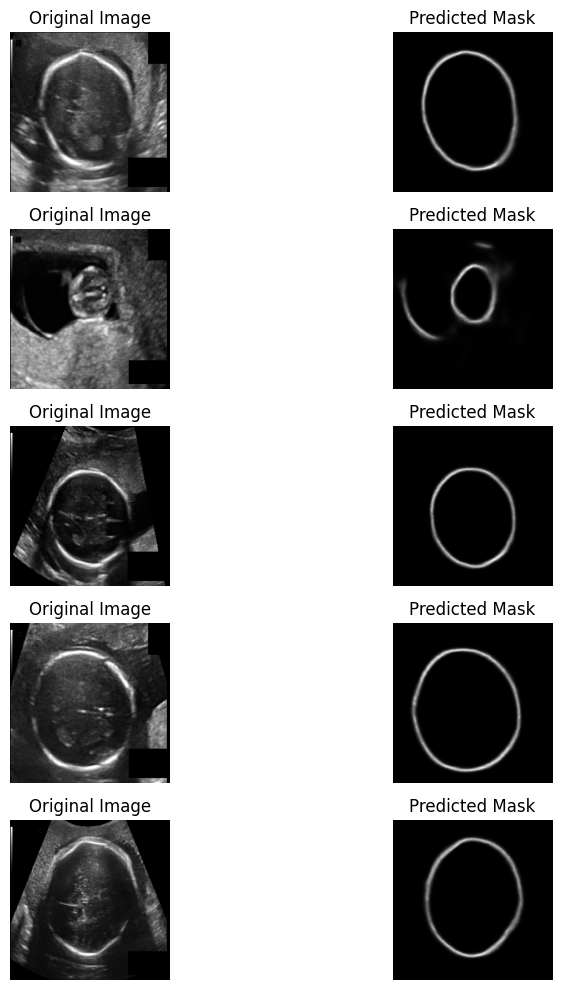

In [ ]:
# Predict masks for validation images
predicted_masks = model.predict(val_images)

# Visualize original images and predicted masks
import matplotlib.pyplot as plt

n = min(len(val_images), 5)  # Number of images to visualize (limit to 5)
fig, axes = plt.subplots(n, 2, figsize=(10, 10))

for i in range(n):
    axes[i, 0].imshow(val_images[i], cmap='gray')
    axes[i, 0].set_title('Original Image')
    axes[i, 0].axis('off')

    axes[i, 1].imshow(predicted_masks[i].squeeze(), cmap='gray')
    axes[i, 1].set_title('Predicted Mask')
    axes[i, 1].axis('off')

plt.tight_layout()
plt.show()


11/11 [==============================] - 4s 407ms/step


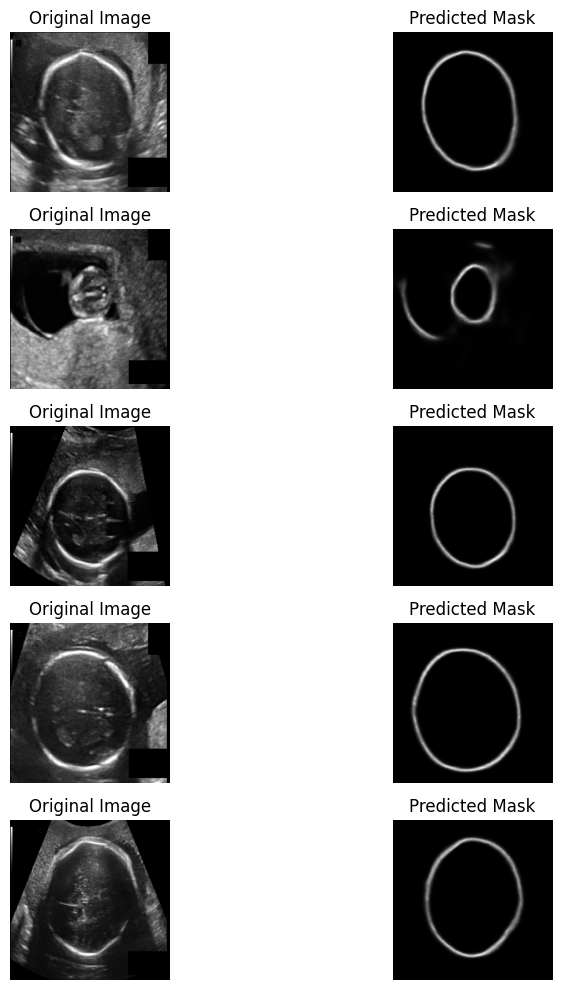

In [ ]:
# Predict masks for validation images
predicted_masks_test = model.predict(test_images)

# Visualize original images and predicted masks
import matplotlib.pyplot as plt

n = min(len(val_images), 5)  # Number of images to visualize (limit to 5)
fig, axes = plt.subplots(n, 2, figsize=(10, 10))

for i in range(n):
    axes[i, 0].imshow(val_images[i], cmap='gray')
    axes[i, 0].set_title('Original Image')
    axes[i, 0].axis('off')

    axes[i, 1].imshow(predicted_masks[i].squeeze(), cmap='gray')
    axes[i, 1].set_title('Predicted Mask')
    axes[i, 1].axis('off')

plt.tight_layout()
plt.show()


In [ ]:
num_images_predicted = len(predicted_masks_test)
print("Number of images in predicted_masks:", num_images_predicted)


Number of images in predicted_masks: 335


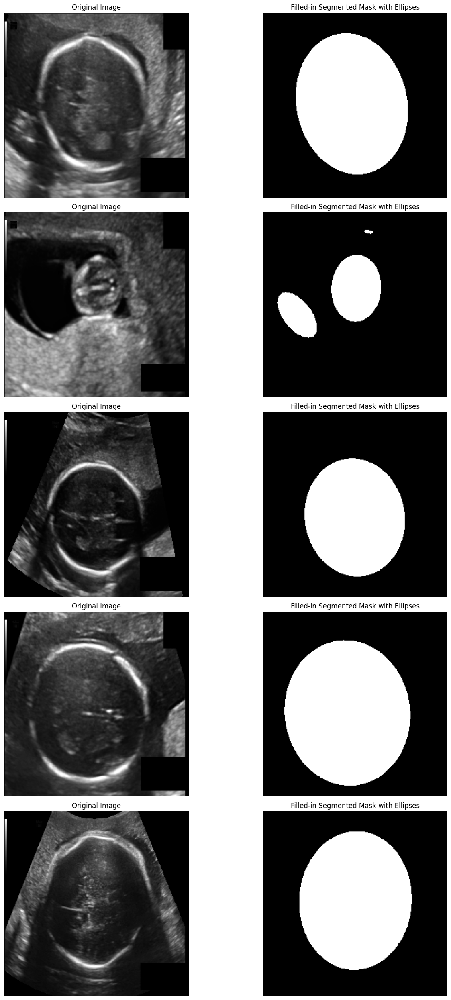

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import cv2
from skimage import morphology

# Function to draw filled ellipses
def draw_filled_ellipses(image, ellipses):
    filled_image = np.zeros_like(image)
    for ellipse in ellipses:
        cv2.ellipse(filled_image, ellipse, (255, 255, 255), -1)  # Draw filled ellipse
    return filled_image

# Threshold the predicted masks
threshold = 0.1 # Adjust this threshold as needed
binary_masks = (predicted_masks > threshold).astype(np.uint8)

# Apply morphological dilation to fill the segmented regions
filled_masks = []
for mask in binary_masks:
    filled_mask = morphology.binary_dilation(mask[:,:,0])
    filled_masks.append(filled_mask)

## Detect ellipses in the filled masks
detected_ellipses = []
for mask in filled_masks:
    mask_uint8 = mask.astype(np.uint8)  # Convert mask to uint8 data type
    contours, _ = cv2.findContours(mask_uint8, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    ellipses = []
    for cnt in contours:
        if len(cnt) >= 5:  # Check if contour has enough points to fit an ellipse
            ellipse = cv2.fitEllipse(cnt)
            ellipses.append(ellipse)
    detected_ellipses.append(ellipses)

# Visualize the results
plt.figure(figsize=(15, 5*num_samples))

for i in range(num_samples):
    # Original image
    plt.subplot(num_samples, 2, 2*i + 1)
    plt.imshow(val_images[i], cmap='gray')
    plt.title('Original Image')
    plt.axis('off')

    # Filled-in segmented mask with ellipses
    filled_image = draw_filled_ellipses(val_images[i], detected_ellipses[i])
    plt.subplot(num_samples, 2, 2*i + 2)
    plt.imshow(filled_image, cmap='gray')
    plt.title('Filled-in Segmented Mask with Ellipses')
    plt.axis('off')

plt.tight_layout()
plt.show()


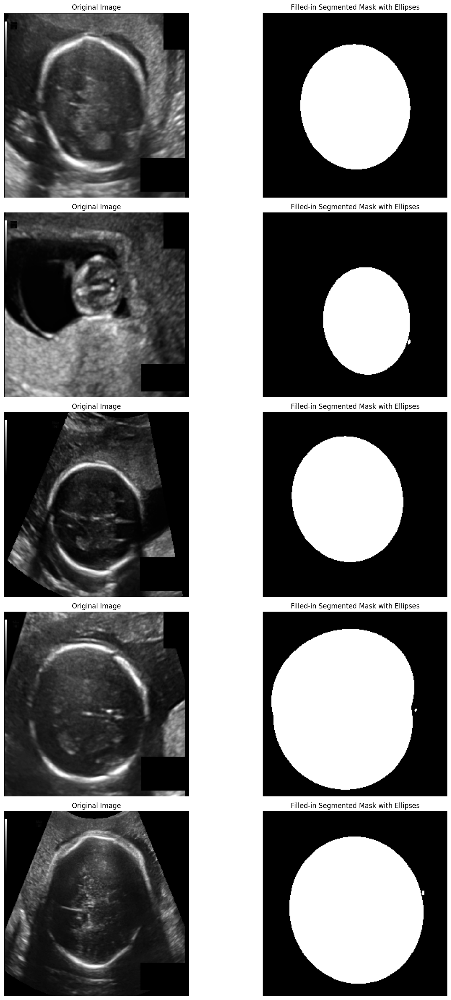

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import cv2
from skimage import morphology

# Function to draw filled ellipses
def draw_filled_ellipses(image, ellipses):
    filled_image = np.zeros_like(image)
    for ellipse in ellipses:
        cv2.ellipse(filled_image, ellipse, (255, 255, 255), -1)  # Draw filled ellipse
    return filled_image

# Threshold the predicted masks
threshold = 0.1 # Adjust this threshold as needed
binary_masks = (predicted_masks_test > threshold).astype(np.uint8)

# Apply morphological dilation to fill the segmented regions
filled_masks = []
for mask in binary_masks:
    filled_mask = morphology.binary_dilation(mask[:,:,0])
    filled_masks.append(filled_mask)

## Detect ellipses in the filled masks
detected_ellipses = []
for mask in filled_masks:
    mask_uint8 = mask.astype(np.uint8)  # Convert mask to uint8 data type
    contours, _ = cv2.findContours(mask_uint8, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    ellipses = []
    for cnt in contours:
        if len(cnt) >= 5:  # Check if contour has enough points to fit an ellipse
            ellipse = cv2.fitEllipse(cnt)
            ellipses.append(ellipse)
    detected_ellipses.append(ellipses)

# Visualize the results
plt.figure(figsize=(15, 5*num_samples))

for i in range(num_samples):
    # Original image
    plt.subplot(num_samples, 2, 2*i + 1)
    plt.imshow(val_images[i], cmap='gray')
    plt.title('Original Image')
    plt.axis('off')

    # Filled-in segmented mask with ellipses
    filled_image = draw_filled_ellipses(val_images[i], detected_ellipses[i])
    plt.subplot(num_samples, 2, 2*i + 2)
    plt.imshow(filled_image, cmap='gray')
    plt.title('Filled-in Segmented Mask with Ellipses')
    plt.axis('off')

plt.tight_layout()
plt.show()


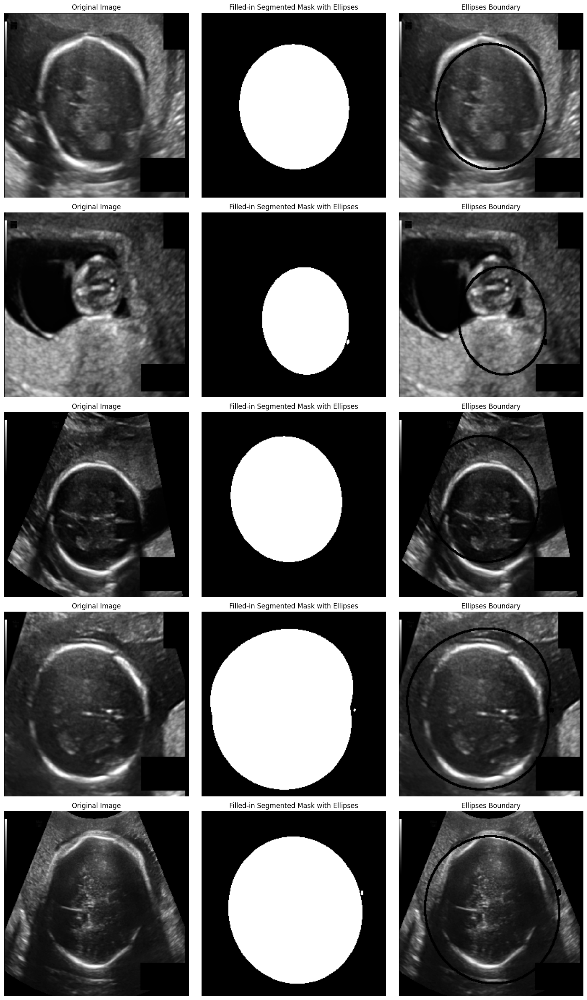

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import cv2
from skimage import morphology

# Function to draw filled ellipses
def draw_filled_ellipses(image, ellipses):
    filled_image = np.zeros_like(image)
    for ellipse in ellipses:
        cv2.ellipse(filled_image, ellipse, (255, 255, 255), -1)  # Draw filled ellipse
    return filled_image

# Threshold the predicted masks
threshold = 0.1 # Adjust this threshold as needed
binary_masks = (predicted_masks_test > threshold).astype(np.uint8)

# Apply morphological dilation to fill the segmented regions
filled_masks = []
for mask in binary_masks:
    filled_mask = morphology.binary_dilation(mask[:,:,0])
    filled_masks.append(filled_mask)

## Detect ellipses in the filled masks
detected_ellipses = []
for mask in filled_masks:
    mask_uint8 = mask.astype(np.uint8)  # Convert mask to uint8 data type
    contours, _ = cv2.findContours(mask_uint8, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    ellipses = []
    for cnt in contours:
        if len(cnt) >= 5:  # Check if contour has enough points to fit an ellipse
            ellipse = cv2.fitEllipse(cnt)
            ellipses.append(ellipse)
    detected_ellipses.append(ellipses)

# Visualize the results
plt.figure(figsize=(15, 5*num_samples))

for i in range(num_samples):
    # Original image
    plt.subplot(num_samples, 3, 3*i + 1)
    plt.imshow(val_images[i], cmap='gray')
    plt.title('Original Image')
    plt.axis('off')

    # Filled-in segmented mask with ellipses
    filled_image = draw_filled_ellipses(val_images[i], detected_ellipses[i])
    plt.subplot(num_samples, 3, 3*i + 2)
    plt.imshow(filled_image, cmap='gray')
    plt.title('Filled-in Segmented Mask with Ellipses')
    plt.axis('off')

    # Apply Canny edge detection
    # Apply Canny edge detection
    edges = cv2.Canny(filled_image.astype(np.uint8), 30, 100)


    # Find contours of edges
    contours, _ = cv2.findContours(edges, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # Draw contours on original image
    contour_image = cv2.drawContours(val_images[i].copy(), contours, -1, (0, 0, 255), 2)
    plt.subplot(num_samples, 3, 3*i + 3)
    plt.imshow(contour_image, cmap='gray')
    plt.title('Ellipses Boundary')
    plt.axis('off')

plt.tight_layout()
plt.show()


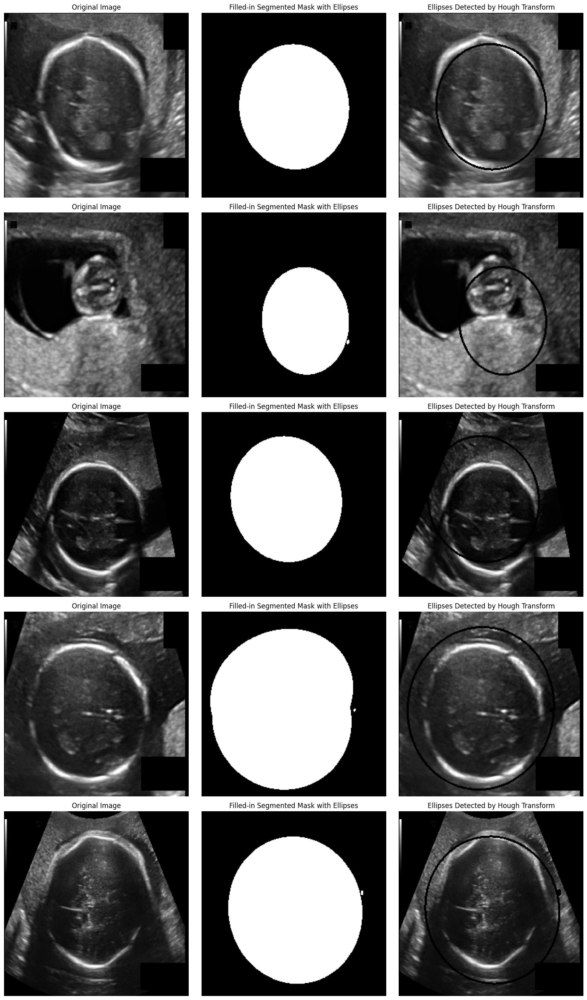

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import cv2
from skimage import morphology

# Function to draw filled ellipses
def draw_filled_ellipses(image, ellipses):
    filled_image = np.zeros_like(image)
    for ellipse in ellipses:
        cv2.ellipse(filled_image, ellipse, (255, 255, 255), -1)  # Draw filled ellipse
    return filled_image

# Threshold the predicted masks
threshold = 0.1 # Adjust this threshold as needed
binary_masks = (predicted_masks_test > threshold).astype(np.uint8)

# Apply morphological dilation to fill the segmented regions
filled_masks = []
for mask in binary_masks:
    filled_mask = morphology.binary_dilation(mask[:,:,0])
    filled_masks.append(filled_mask)

## Detect ellipses in the filled masks
detected_ellipses = []
for mask in filled_masks:
    mask_uint8 = mask.astype(np.uint8)  # Convert mask to uint8 data type
    contours, _ = cv2.findContours(mask_uint8, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    ellipses = []
    for cnt in contours:
        if len(cnt) >= 5:  # Check if contour has enough points to fit an ellipse
            ellipse = cv2.fitEllipse(cnt)
            ellipses.append(ellipse)
    detected_ellipses.append(ellipses)

# Visualize the results
plt.figure(figsize=(15, 5*num_samples))

for i in range(num_samples):
    # Original image
    plt.subplot(num_samples, 3, 3*i + 1)
    plt.imshow(val_images[i], cmap='gray')
    plt.title('Original Image')
    plt.axis('off')

    # Filled-in segmented mask with ellipses
    filled_image = draw_filled_ellipses(val_images[i], detected_ellipses[i])
    plt.subplot(num_samples, 3, 3*i + 2)
    plt.imshow(filled_image, cmap='gray')
    plt.title('Filled-in Segmented Mask with Ellipses')
    plt.axis('off')

    # Apply Canny edge detection
    edges = cv2.Canny(filled_image.astype(np.uint8), 30, 100)

    # Find contours from edges
    contours, _ = cv2.findContours(edges, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # Fit ellipses to contours using Hough transform
    ellipses = []
    for cnt in contours:
        if len(cnt) >= 5:  # Check if contour has enough points to fit an ellipse
            ellipse = cv2.fitEllipse(cnt)
            ellipses.append(ellipse)

    # Draw the detected ellipses on the original image
    detected_image = val_images[i].copy()
    for ellipse in ellipses:
        cv2.ellipse(detected_image, ellipse, (0, 0, 255), 2)

    # Display the image with detected ellipses
    plt.subplot(num_samples, 3, 3*i + 3)
    plt.imshow(detected_image, cmap='gray')
    plt.title('Ellipses Detected by Hough Transform')
    plt.axis('off')

plt.tight_layout()
plt.show()


In [ ]:
import numpy as np
import cv2
import csv

#USEFUL ONE
# Function to convert degrees to radians
def degrees_to_radians(degrees):
    return degrees * np.pi / 180.0

# Function to write ellipse parameters to CSV file
def write_ellipse_parameters_to_csv(filename, ellipses_parameters):
    with open(filename, 'w', newline='') as csvfile:
        writer = csv.writer(csvfile)
        writer.writerow(['filename', 'center_x_mm', 'center_y_mm', 'semi_axes_a_mm', 'semi_axes_b_mm', 'angle_rad'])
        writer.writerows(ellipses_parameters)

# Threshold the predicted masks
threshold = 0.1 # Adjust this threshold as needed
binary_masks = (predicted_masks_test > threshold).astype(np.uint8)

# Apply morphological dilation to fill the segmented regions
filled_masks = []
for mask in binary_masks:
    filled_mask = morphology.binary_dilation(mask[:,:,0])
    filled_masks.append(filled_mask)

# Initialize set to hold unique filenames
unique_filenames = set()

# Initialize list to hold all ellipse parameters
all_ellipses_parameters = []

# Detect ellipses in the filled masks and convert parameters to CSV format
for i, mask in enumerate(filled_masks):
    mask_uint8 = mask.astype(np.uint8)  # Convert mask to uint8 data type
    contours, _ = cv2.findContours(mask_uint8, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    for cnt in contours:
        if len(cnt) >= 5:  # Check if contour has enough points to fit an ellipse
            ellipse = cv2.fitEllipse(cnt)
            filename = f"{i+1:03d}_HC.png"  # Example filename format
            if filename not in unique_filenames:
                center_x_mm, center_y_mm = ellipse[0]
                semi_axes_a_mm, semi_axes_b_mm = ellipse[1]
                angle_rad = degrees_to_radians(ellipse[2])
                ellipses_parameters = [filename, center_x_mm, center_y_mm, semi_axes_a_mm, semi_axes_b_mm, angle_rad]
                all_ellipses_parameters.append(ellipses_parameters)
                unique_filenames.add(filename)

# Write all ellipse parameters to CSV file
write_ellipse_parameters_to_csv('/content/drive/My Drive/MedIA/ellipse_parameters.csv', all_ellipses_parameters)


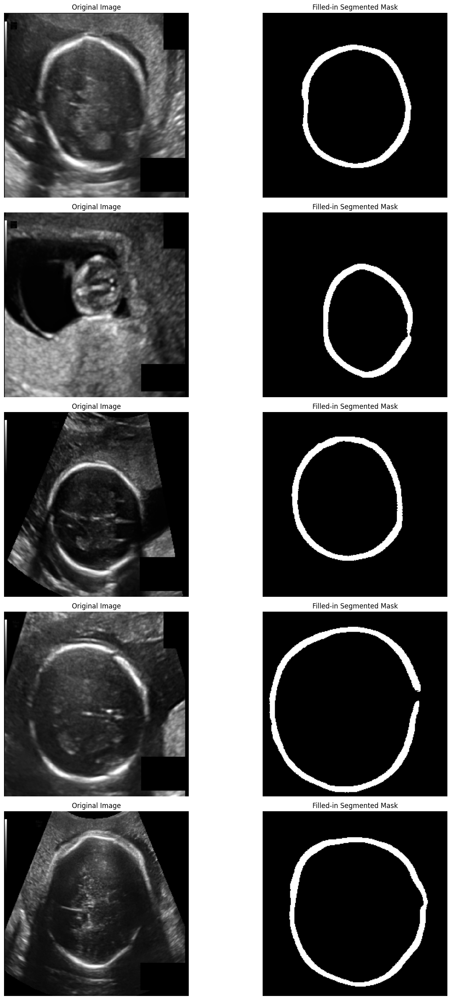

In [ ]:
import numpy as np
num_samples = min(5, len(test_images))  # Number of samples to display, limit to 5 for clarity


# Threshold the predicted masks
threshold = 0.05  # Adjust this threshold as needed
binary_masks = (predicted_masks_test > threshold).astype(np.uint8)

# Display the filled-in segmented images
plt.figure(figsize=(15, 5*num_samples))

for i in range(num_samples):
    # Original image
    plt.subplot(num_samples, 2, 2*i + 1)
    plt.imshow(val_images[i], cmap='gray')
    plt.title('Original Image')
    plt.axis('off')

    # Filled-in segmented mask
    plt.subplot(num_samples, 2, 2*i + 2)
    plt.imshow(binary_masks[i][:, :, 0], cmap='gray')  # Displaying only the first channel (binary mask)
    plt.title('Filled-in Segmented Mask')
    plt.axis('off')

plt.tight_layout()
plt.show()


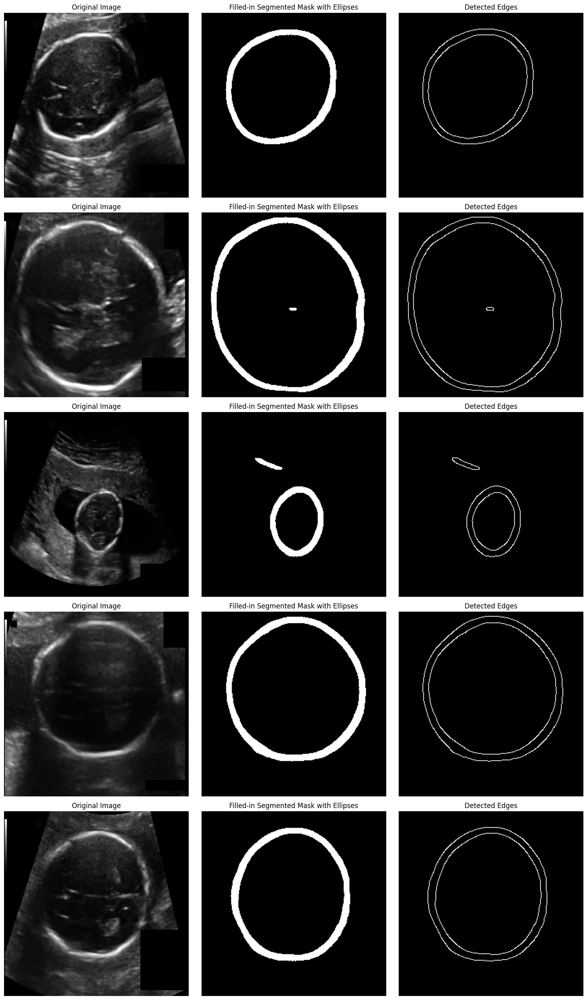

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import cv2
from skimage import morphology

# Function to draw filled ellipses
def draw_filled_ellipses(image, ellipses):
    filled_image = np.zeros_like(image)
    for ellipse in ellipses:
        cv2.ellipse(filled_image, ellipse, (255, 255, 255), -1)  # Draw filled ellipse
    return filled_image

# Threshold the predicted masks
threshold = 0.05  # Adjust this threshold as needed
binary_masks = (predicted_masks > threshold).astype(np.uint8)

# Apply morphological dilation to fill the segmented regions
filled_masks = []
for mask in binary_masks:
    filled_mask = morphology.binary_dilation(mask[:,:,0])
    filled_masks.append(filled_mask)

## Detect ellipses in the filled masks
detected_ellipses = []
for mask in filled_masks:
    mask_uint8 = mask.astype(np.uint8)  # Convert mask to uint8 data type
    contours, _ = cv2.findContours(mask_uint8, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    ellipses = []
    for cnt in contours:
        if len(cnt) >= 5:  # Check if contour has enough points to fit an ellipse
            ellipse = cv2.fitEllipse(cnt)
            ellipses.append(ellipse)
    detected_ellipses.append(ellipses)

# Function to detect edges using Canny edge detection
def detect_edges(image):
    # Convert filled image to uint8
    image_uint8 = (image * 255).astype(np.uint8)
    # Apply Canny edge detection with adjusted thresholds
    edges = cv2.Canny(image_uint8, 30, 90)
    return edges

# Apply edge detection on the filled masks
detected_edges = [detect_edges(mask) for mask in filled_masks]

# Visualize the results
plt.figure(figsize=(15, 5*num_samples))

for i in range(num_samples):
    plt.subplot(num_samples, 3, 3*i + 1)
    plt.imshow(val_images[i], cmap='gray')
    plt.title('Original Image')
    plt.axis('off')

    plt.subplot(num_samples, 3, 3*i + 2)
    plt.imshow(filled_masks[i], cmap='gray')
    plt.title('Filled-in Segmented Mask with Ellipses')
    plt.axis('off')

    plt.subplot(num_samples, 3, 3*i + 3)
    plt.imshow(detected_edges[i], cmap='gray')
    plt.title('Detected Edges')
    plt.axis('off')

plt.tight_layout()
plt.show()


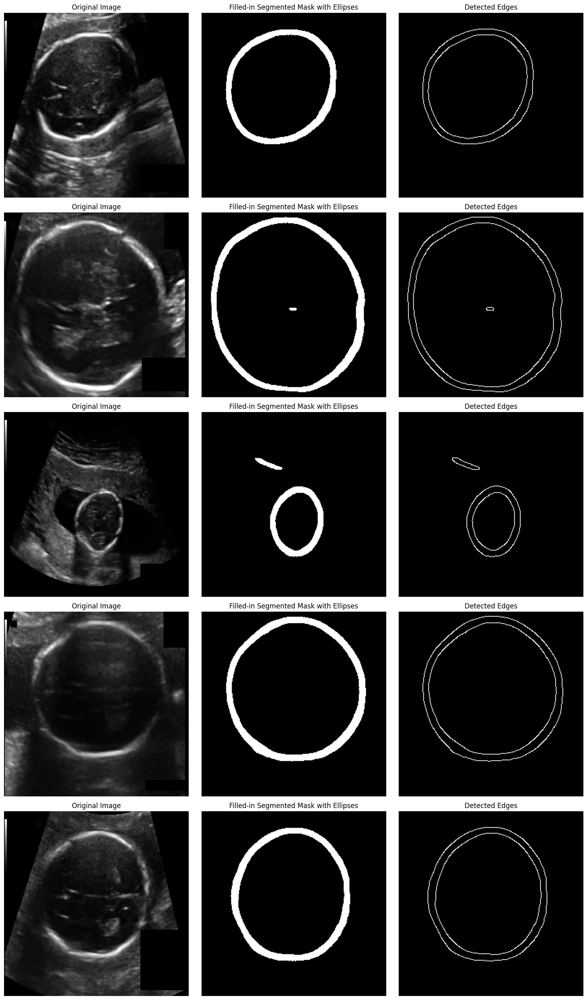

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import cv2
from skimage import morphology

# Function to draw filled ellipses
def draw_filled_ellipses(image, ellipses):
    filled_image = np.zeros_like(image)
    for ellipse in ellipses:
        cv2.ellipse(filled_image, ellipse, (255, 255, 255), -1)  # Draw filled ellipse
    return filled_image

# Threshold the predicted masks
threshold = 0.05  # Adjust this threshold as needed
binary_masks = (predicted_masks > threshold).astype(np.uint8)

# Apply morphological dilation to fill the segmented regions
filled_masks = []
for mask in binary_masks:
    filled_mask = morphology.binary_dilation(mask[:,:,0])
    filled_masks.append(filled_mask)

## Detect ellipses in the filled masks
detected_ellipses = []
for mask in filled_masks:
    mask_uint8 = mask.astype(np.uint8)  # Convert mask to uint8 data type
    contours, _ = cv2.findContours(mask_uint8, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    ellipses = []
    for cnt in contours:
        if len(cnt) >= 5:  # Check if contour has enough points to fit an ellipse
            ellipse = cv2.fitEllipse(cnt)
            ellipses.append(ellipse)
    detected_ellipses.append(ellipses)

# Function to detect edges using Canny edge detection
def detect_edges(image):
    # Convert filled image to uint8
    image_uint8 = (image * 255).astype(np.uint8)
    # Apply Canny edge detection with adjusted thresholds
    edges = cv2.Canny(image_uint8, 30, 90)
    return edges

# Apply edge detection on the filled masks
detected_edges = [detect_edges(mask) for mask in filled_masks]

# Visualize the results
plt.figure(figsize=(15, 5*num_samples))

for i in range(num_samples):
    plt.subplot(num_samples, 3, 3*i + 1)
    plt.imshow(val_images[i], cmap='gray')
    plt.title('Original Image')
    plt.axis('off')

    plt.subplot(num_samples, 3, 3*i + 2)
    plt.imshow(filled_masks[i], cmap='gray')
    plt.title('Filled-in Segmented Mask with Ellipses')
    plt.axis('off')

    plt.subplot(num_samples, 3, 3*i + 3)
    plt.imshow(detected_edges[i], cmap='gray')
    plt.title('Detected Edges')
    plt.axis('off')

plt.tight_layout()
plt.show()


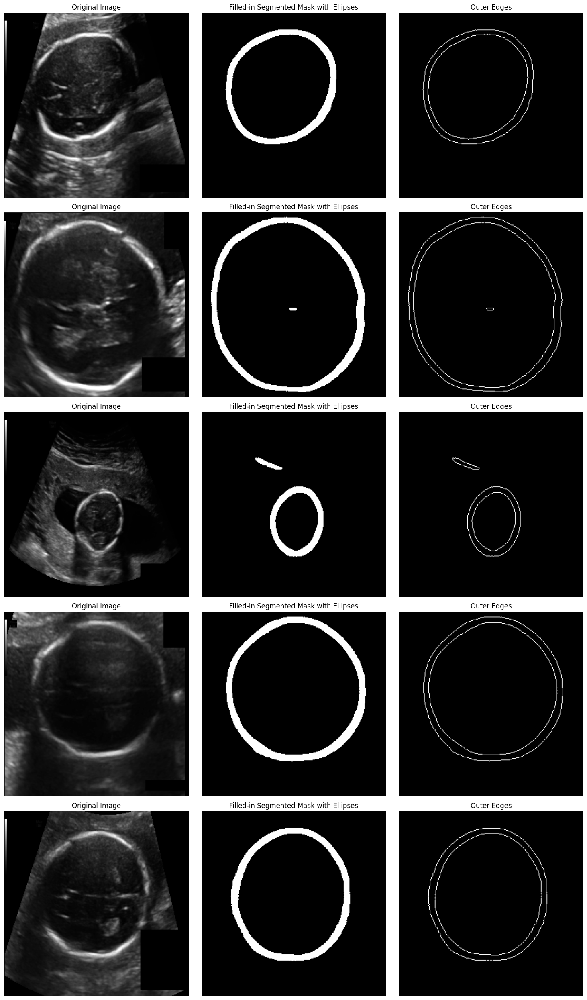

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import cv2
from skimage import morphology

# Function to draw filled ellipses
def draw_filled_ellipses(image, ellipses):
    filled_image = np.zeros_like(image)
    for ellipse in ellipses:
        cv2.ellipse(filled_image, ellipse, (255, 255, 255), -1)  # Draw filled ellipse
    return filled_image

# Threshold the predicted masks
threshold = 0.05  # Adjust this threshold as needed
binary_masks = (predicted_masks > threshold).astype(np.uint8)

# Apply morphological dilation to fill the segmented regions
filled_masks = []
for mask in binary_masks:
    filled_mask = morphology.binary_dilation(mask[:,:,0])
    filled_masks.append(filled_mask)

# Apply morphological erosion to obtain only the outer edges
outer_edges = [cv2.absdiff(filled_mask.astype(np.uint8), morphology.binary_erosion(filled_mask).astype(np.uint8)) for filled_mask in filled_masks]

# Visualize the results
plt.figure(figsize=(15, 5*num_samples))

for i in range(num_samples):
    plt.subplot(num_samples, 3, 3*i + 1)
    plt.imshow(val_images[i], cmap='gray')
    plt.title('Original Image')
    plt.axis('off')

    plt.subplot(num_samples, 3, 3*i + 2)
    plt.imshow(filled_masks[i], cmap='gray')
    plt.title('Filled-in Segmented Mask with Ellipses')
    plt.axis('off')

    plt.subplot(num_samples, 3, 3*i + 3)
    plt.imshow(outer_edges[i], cmap='gray')
    plt.title('Outer Edges')
    plt.axis('off')

plt.tight_layout()
plt.show()


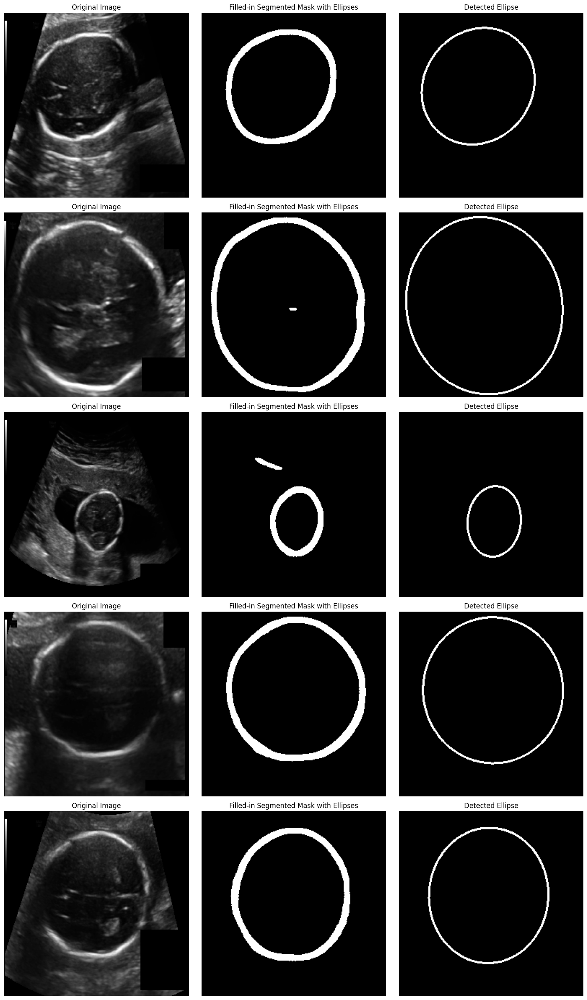

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import cv2
from skimage import morphology

# Function to draw filled ellipses
def draw_filled_ellipses(image, ellipses):
    filled_image = np.zeros_like(image)
    for ellipse in ellipses:
        cv2.ellipse(filled_image, ellipse, (255, 255, 255), -1)  # Draw filled ellipse
    return filled_image

# Function to detect edges using Canny edge detection
def detect_edges(image):
    # Convert filled image to uint8
    image_uint8 = (image * 255).astype(np.uint8)
    # Apply Canny edge detection with adjusted thresholds
    edges = cv2.Canny(image_uint8, 30, 90)
    return edges

# Function to fit an ellipse to the detected edges
def fit_ellipse_to_edges(edges):
    # Find contours of the edges
    contours, _ = cv2.findContours(edges, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # Fit ellipse to the largest contour
    if contours:
        contour = max(contours, key=cv2.contourArea)
        ellipse = cv2.fitEllipse(contour)
        return ellipse
    else:
        return None

# Threshold the predicted masks
threshold = 0.05  # Adjust this threshold as needed
binary_masks = (predicted_masks > threshold).astype(np.uint8)

# Apply morphological dilation to fill the segmented regions
filled_masks = []
for mask in binary_masks:
    filled_mask = morphology.binary_dilation(mask[:,:,0])
    filled_masks.append(filled_mask)

# Apply edge detection on the filled masks
detected_edges = [detect_edges(mask) for mask in filled_masks]

# Fit ellipses to the detected edges
detected_ellipses = [fit_ellipse_to_edges(edges) for edges in detected_edges]

# Visualize the results
plt.figure(figsize=(15, 5*num_samples))

for i in range(num_samples):
    plt.subplot(num_samples, 3, 3*i + 1)
    plt.imshow(val_images[i], cmap='gray')
    plt.title('Original Image')
    plt.axis('off')

    plt.subplot(num_samples, 3, 3*i + 2)
    plt.imshow(filled_masks[i], cmap='gray')
    plt.title('Filled-in Segmented Mask with Ellipses')
    plt.axis('off')

    plt.subplot(num_samples, 3, 3*i + 3)
    if detected_ellipses[i] is not None:
      ellipse_image = np.zeros_like(filled_masks[i], dtype=np.uint8)
      cv2.ellipse(ellipse_image, detected_ellipses[i], (255, 0, 0), 2)  # Draw ellipse in red
      plt.imshow(ellipse_image, cmap='gray')
      plt.title('Detected Ellipse')
    else:
      plt.imshow(filled_masks[i], cmap='gray')
      plt.title('No Ellipse Detected')
    plt.axis('off')


plt.tight_layout()
plt.show()


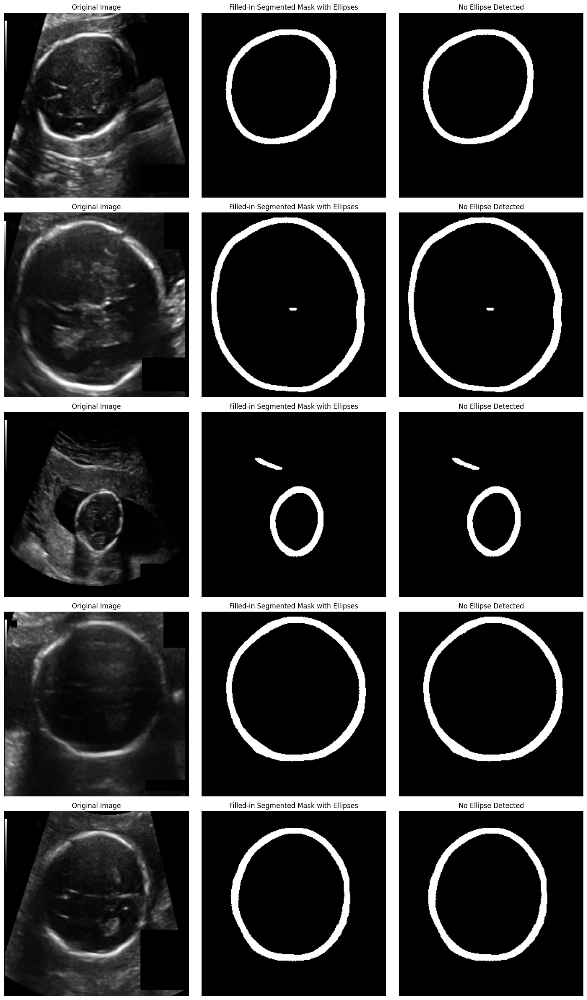

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import cv2
from skimage import morphology

# Function to draw filled ellipses
def draw_filled_ellipses(image, ellipses):
    filled_image = np.zeros_like(image)
    for ellipse in ellipses:
        cv2.ellipse(filled_image, ellipse, (255, 255, 255), -1)  # Draw filled ellipse
    return filled_image

# Threshold the predicted masks
threshold = 0.05  # Adjust this threshold as needed
binary_masks = (predicted_masks > threshold).astype(np.uint8)

# Apply morphological dilation to fill the segmented regions
filled_masks = []
for mask in binary_masks:
    filled_mask = morphology.binary_dilation(mask[:,:,0])
    filled_masks.append(filled_mask)

# Apply morphological erosion to obtain only the outer edges
outer_edges = [cv2.absdiff(filled_mask.astype(np.uint8), morphology.binary_erosion(filled_mask).astype(np.uint8)) for filled_mask in filled_masks]

# Detect ellipses using Hough transform
def detect_ellipses(edges):
    ellipses = cv2.HoughCircles(edges, cv2.HOUGH_GRADIENT, dp=1, minDist=20, param1=50, param2=30, minRadius=10, maxRadius=100)
    if ellipses is not None:
        ellipses = np.uint16(np.around(ellipses))
        return ellipses[0]  # Return only the first detected ellipse
    else:
        return None

# Detect ellipses in the outer edges
detected_ellipses = [detect_ellipses(outer_edges[i]) for i in range(num_samples)]

# Visualize the results
plt.figure(figsize=(15, 5*num_samples))

for i in range(num_samples):
    plt.subplot(num_samples, 3, 3*i + 1)
    plt.imshow(val_images[i], cmap='gray')
    plt.title('Original Image')
    plt.axis('off')

    plt.subplot(num_samples, 3, 3*i + 2)
    plt.imshow(filled_masks[i], cmap='gray')
    plt.title('Filled-in Segmented Mask with Ellipses')
    plt.axis('off')

    plt.subplot(num_samples, 3, 3*i + 3)
    if detected_ellipses[i] is not None:
        image_with_ellipse = val_images[i].copy()
        for ellipse in detected_ellipses[i]:
            cv2.ellipse(image_with_ellipse, (ellipse[0], ellipse[1]), (ellipse[2], ellipse[2]), ellipse[3], 0, 360, (255, 0, 0), 2)
        plt.imshow(image_with_ellipse, cmap='gray')
        plt.title('Detected Ellipse')
    else:
        plt.imshow(filled_masks[i], cmap='gray')
        plt.title('No Ellipse Detected')
    plt.axis('off')

plt.tight_layout()
plt.show()
?

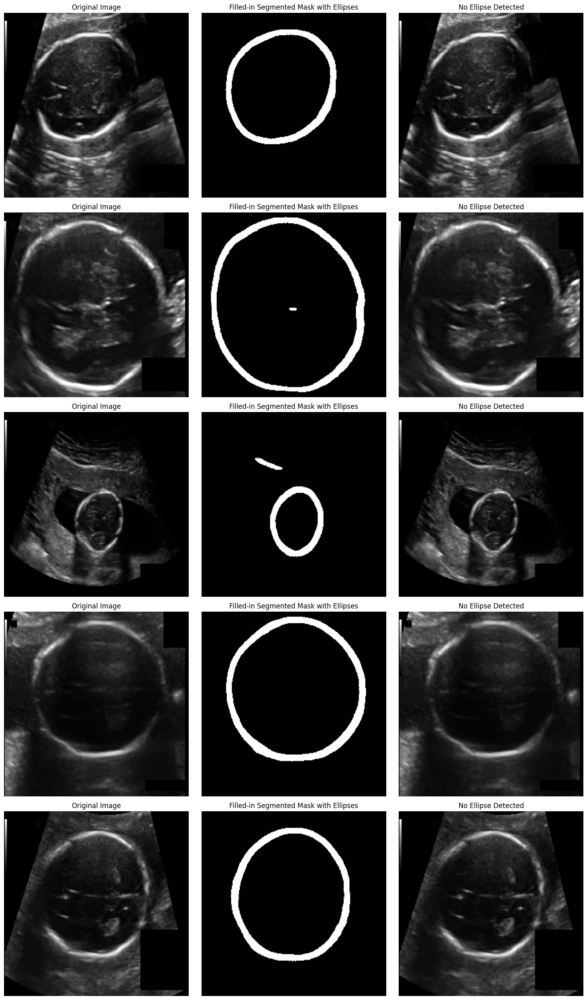

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import cv2
from skimage import morphology

# Function to draw filled ellipses
def draw_filled_ellipses(image, ellipses):
    filled_image = np.zeros_like(image)
    for ellipse in ellipses:
        cv2.ellipse(filled_image, ellipse, (255, 255, 255), -1)  # Draw filled ellipse
    return filled_image

# Threshold the predicted masks
threshold = 0.05  # Adjust this threshold as needed
binary_masks = (predicted_masks > threshold).astype(np.uint8)

# Apply morphological dilation to fill the segmented regions
filled_masks = []
for mask in binary_masks:
    filled_mask = morphology.binary_dilation(mask[:,:,0])
    filled_masks.append(filled_mask)

# Apply morphological erosion to obtain only the outer edges
outer_edges = [cv2.absdiff(filled_mask.astype(np.uint8), morphology.binary_erosion(filled_mask).astype(np.uint8)) for filled_mask in filled_masks]

# Detect ellipses using Hough transform
def detect_ellipses(edges):
    ellipses = cv2.HoughCircles(edges, cv2.HOUGH_GRADIENT, dp=1, minDist=20, param1=50, param2=30, minRadius=10, maxRadius=100)
    if ellipses is not None:
        ellipses = np.uint16(np.around(ellipses))
        return ellipses[0]  # Return only the first detected ellipse
    else:
        return None

# Detect ellipses in the outer edges
detected_ellipses = [detect_ellipses(outer_edges[i]) for i in range(num_samples)]

# Visualize the results
plt.figure(figsize=(15, 5*num_samples))

for i in range(num_samples):
    plt.subplot(num_samples, 3, 3*i + 1)
    plt.imshow(val_images[i], cmap='gray')
    plt.title('Original Image')
    plt.axis('off')

    plt.subplot(num_samples, 3, 3*i + 2)
    plt.imshow(filled_masks[i], cmap='gray')
    plt.title('Filled-in Segmented Mask with Ellipses')
    plt.axis('off')

    plt.subplot(num_samples, 3, 3*i + 3)
    if detected_ellipses[i] is not None:
        image_with_ellipse = val_images[i].copy()
        for ellipse in detected_ellipses[i]:
            cv2.ellipse(image_with_ellipse, (ellipse[0], ellipse[1]), (ellipse[2], ellipse[2]), ellipse[3], 0, 360, (255, 0, 0), 2)
        plt.imshow(image_with_ellipse, cmap='gray')
        plt.title('Detected Ellipse')
    else:
        plt.imshow(val_images[i], cmap='gray')
        plt.title('No Ellipse Detected')
    plt.axis('off')

plt.tight_layout()
plt.show()


error: OpenCV(4.8.0) :-1: error: (-5:Bad argument) in function 'ellipse'
> Overload resolution failed:
>  - ellipse() missing required argument 'startAngle' (pos 5)
>  - ellipse() missing required argument 'startAngle' (pos 5)
>  - img data type = 0 is not supported
>  - Expected Ptr<cv::UMat> for argument 'img'


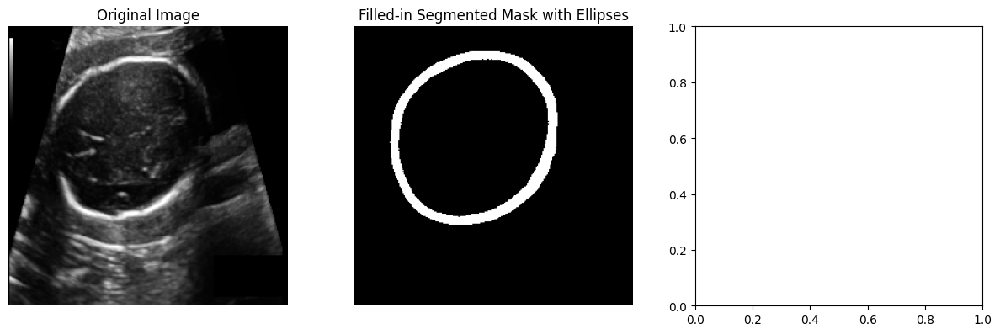

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import cv2
from skimage import morphology

# Function to draw filled ellipses
def draw_filled_ellipses(image, ellipses):
    # Create a copy of the image
    filled_image = np.copy(image)

    # Draw filled ellipse on the copied image
    for ellipse in ellipses:
        cv2.ellipse(filled_image, ellipse, (255, 255, 255), -1)  # Draw filled ellipse

    # Overlay red ellipse on the filled image
    if ellipses:
        # Convert the filled image to grayscale
        filled_gray = cv2.cvtColor(filled_image, cv2.COLOR_BGR2GRAY)

        # Find contours of the filled ellipse
        contours, _ = cv2.findContours(filled_gray, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

        # Draw red ellipse on top of the filled ellipse
        for contour in contours:
            ellipse = cv2.fitEllipse(contour)
            cv2.ellipse(image, ellipse, (0, 0, 255), 2)  # Draw red ellipse with thickness 2

    return filled_image

# Function to detect edges using Canny edge detection
def detect_edges(image):
    # Convert filled image to uint8
    image_uint8 = (image * 255).astype(np.uint8)
    # Apply Canny edge detection with adjusted thresholds
    edges = cv2.Canny(image_uint8, 30, 90)
    return edges

# Function to fit an ellipse to the detected edges
def fit_ellipse_to_edges(edges):
    # Find contours of the edges
    contours, _ = cv2.findContours(edges, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # Fit ellipse to the largest contour
    if contours:
        contour = max(contours, key=cv2.contourArea)
        ellipse = cv2.fitEllipse(contour)
        return ellipse
    else:
        return None

# Threshold the predicted masks
threshold = 0.05  # Adjust this threshold as needed
binary_masks = (predicted_masks > threshold).astype(np.uint8)

# Apply morphological dilation to fill the segmented regions
filled_masks = []
for mask in binary_masks:
    filled_mask = morphology.binary_dilation(mask[:,:,0])
    filled_masks.append(filled_mask)

# Apply edge detection on the filled masks
detected_edges = [detect_edges(mask) for mask in filled_masks]

# Fit ellipses to the detected edges
detected_ellipses = [fit_ellipse_to_edges(edges) for edges in detected_edges]

# Visualize the results
plt.figure(figsize=(15, 5*num_samples))

for i in range(num_samples):
    plt.subplot(num_samples, 3, 3*i + 1)
    plt.imshow(val_images[i], cmap='gray')
    plt.title('Original Image')
    plt.axis('off')

    plt.subplot(num_samples, 3, 3*i + 2)
    plt.imshow(filled_masks[i], cmap='gray')
    plt.title('Filled-in Segmented Mask with Ellipses')
    plt.axis('off')

    plt.subplot(num_samples, 3, 3*i + 3)
    if detected_ellipses[i] is not None:
        ellipse_image = draw_filled_ellipses(filled_masks[i], [detected_ellipses[i]])
        plt.imshow(ellipse_image, cmap='gray')
        plt.title('Detected Ellipse')
    else:
        plt.imshow(filled_masks[i], cmap='gray')
        plt.title('No Ellipse Detected')
    plt.axis('off')

plt.tight_layout()
plt.show()


In [ ]:
from tabulate import tabulate

# Provided aggregates
aggregates = {
    "DICE": {"max": 99.68, "min": 89.12, "mean": 97.70, "std": 1.32, "25pc": 97.21, "50pc": 97.99, "75pc": 98.45},
    "hausdorff_distance": {"max": 4.86, "min": 0.24, "mean": 1.40, "std": 0.83, "25pc": 0.80, "50pc": 1.15, "75pc": 1.76},
    "DICE_trimester_1": {"max": 99.08, "min": 89.12, "mean": 96.45, "std": 2.25, "25pc": None, "50pc": None, "75pc": None},
    "DICE_trimester_2": {"max": 99.68, "min": 94.99, "mean": 98.00, "std": 0.86, "25pc": None, "50pc": None, "75pc": None},
    "DICE_trimester_3": {"max": 99.34, "min": 95.61, "mean": 97.65, "std": 0.83, "25pc": None, "50pc": None, "75pc": None},
    "hausdorff_distance_trimester_1": {"max": 3.65, "min": 0.29, "mean": 0.97, "std": 0.68, "25pc": None, "50pc": None, "75pc": None},
    "hausdorff_distance_trimester_2": {"max": 4.21, "min": 0.24, "mean": 1.28, "std": 0.64, "25pc": None, "50pc": None, "75pc": None},
    "hausdorff_distance_trimester_3": {"max": 4.86, "min": 0.76, "mean": 2.49, "std": 0.96, "25pc": None, "50pc": None, "75pc": None}
}

# Create headers and data for the table
headers = ["Metric", "Maximum", "Minimum", "Mean", "Standard Deviation", "25th Percentile", "50th Percentile", "75th Percentile"]
data = []

for metric, values in aggregates.items():
    data.append([metric, values["max"], values["min"], values["mean"], values["std"], values["25pc"], values["50pc"], values["75pc"]])

# Generate the table
table = tabulate(data, headers=headers, tablefmt="github")

# Print the table
print(table)


| Metric                         |   Maximum |   Minimum |   Mean |   Standard Deviation |   25th Percentile |   50th Percentile |   75th Percentile |
|--------------------------------|-----------|-----------|--------|----------------------|-------------------|-------------------|-------------------|
| DICE                           |     99.68 |     89.12 |  97.7  |                 1.32 |             97.21 |             97.99 |             98.45 |
| hausdorff_distance             |      4.86 |      0.24 |   1.4  |                 0.83 |              0.8  |              1.15 |              1.76 |
| DICE_trimester_1               |     99.08 |     89.12 |  96.45 |                 2.25 |                   |                   |                   |
| DICE_trimester_2               |     99.68 |     94.99 |  98    |                 0.86 |                   |                   |                   |
| DICE_trimester_3               |     99.34 |     95.61 |  97.65 |                 0.83 |    